____
# `Chapter 1` -- Introducing Image Processing and scikit-image
____

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Make images come alive with scikit image

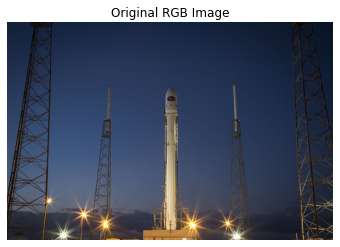

In [2]:
from skimage import data             # there are built in images in [scikit image] library in [data]

rocket_image = data.rocket()
plt.imshow(rocket_image)
plt.axis('off')
plt.title('Original RGB Image')
plt.show()

In [3]:
rocket_image.shape            # any RGB Image are 3 Dimensions

(427, 640, 3)

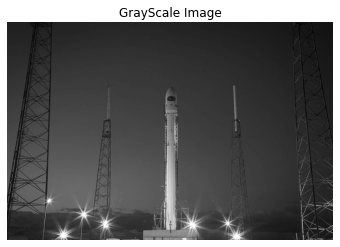

In [4]:
from skimage import data, color

grayscale = color.rgb2gray(rocket_image)

plt.imshow(grayscale, cmap= 'gray')
plt.axis('off')
plt.title('GrayScale Image')
plt.show()

In [5]:
grayscale.shape            # any GrayScale Image are 1 Dimension.

(427, 640)

## NumPy for images

In [6]:
# Loading the image using Matplotlib:
# Any image is numby array

fruits_image = plt.imread('Image Processing Images//chapter 1//fruits-1.jpg')
type(fruits_image)

numpy.ndarray

In [7]:
# As we know any colored image is 3D [Red, Green & Blue]:

# Obtaining the red values of the image -- First channel is red.
red = fruits_image[:, :, 0]    

# Obtaining the green values of the image -- Second channel is green.
green = fruits_image[:, :, 1]

# Obtaining the blue values of the image -- Third channel is blue.
blue = fruits_image[:, :, 2]

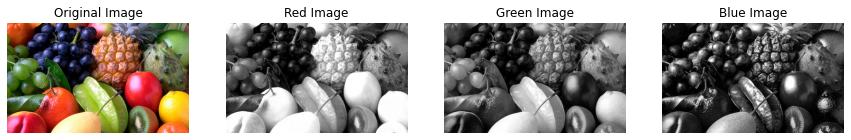

In [8]:
# show the 3 colors images:

fig, ax = plt.subplots(1, 4, figsize=(15, 15))

plt.sca(ax[0])
plt.imshow(fruits_image)
plt.axis('off')
plt.title('Original Image')

plt.sca(ax[1])
plt.imshow(red, cmap= 'gray')
plt.axis('off')
plt.title('Red Image')

plt.sca(ax[2])
plt.imshow(green, cmap= 'gray')
plt.axis('off')
plt.title('Green Image')

plt.sca(ax[3])
plt.imshow(blue, cmap= 'gray')
plt.axis('off')
plt.title('Blue Image')
plt.show()

In [9]:
# Image Shape
fruits_image.shape

(403, 665, 3)

In [10]:
# Image Size
fruits_image.size           # 403 * 665 * 3 = 803985 pixels

803985

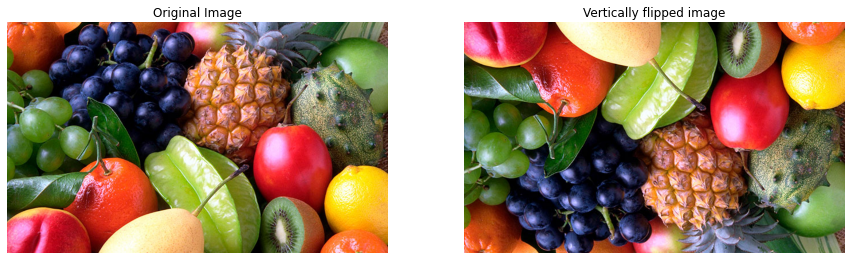

In [11]:
# Flip the image in up direction [Vertical flipped]       -- قلب رأسي
vertically_flipped = np.flipud(fruits_image)


fig, ax= plt.subplots(1, 2, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(fruits_image)
plt.axis('off')
plt.title('Original Image')

plt.sca(ax[1])
plt.imshow(vertically_flipped)
plt.axis('off')
plt.title('Vertically flipped image')
plt.show()

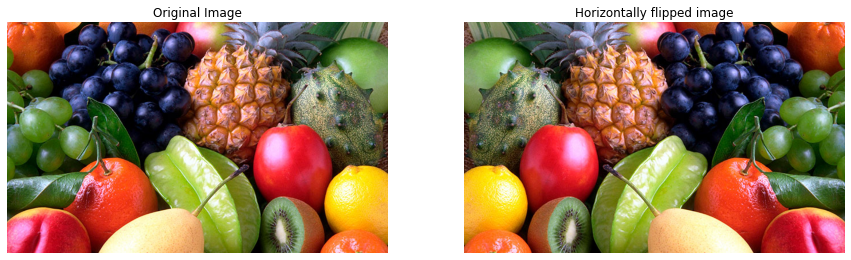

In [12]:
# Flip the image in left direction [Horizontal flipped]       -- قلب أفقي
Horizontally_flipped = np.fliplr(fruits_image)


fig, ax= plt.subplots(1, 2, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(fruits_image)
plt.axis('off')
plt.title('Original Image')

plt.sca(ax[1])
plt.imshow(Horizontally_flipped)
plt.axis('off')
plt.title('Horizontally flipped image')
plt.show()

In [13]:
# # Flip the image in up direction [Vertical flipped]
# madrid_image= plt.imread('Image Processing Images//chapter 1//sevilleup(2).jpg')

# fig, ax= plt.subplots(1, 2, figsize= [15, 10])

# plt.sca(ax[0])
# plt.imshow(madrid_image)
# plt.axis('off')
# plt.title('Original Image')

# plt.sca(ax[1])
# Horizontally_flipped = np.fliplr(madrid_image)
# plt.imshow(Horizontally_flipped)
# plt.axis('off')
# plt.title('Horizontally flipped image')
# plt.show()

## Histograms in Matplotlib:
### Applications of histograms
- #### `Analysis`
- #### `Thresholding`
- #### `Brightness and contrast`
- #### `Equalize an image`

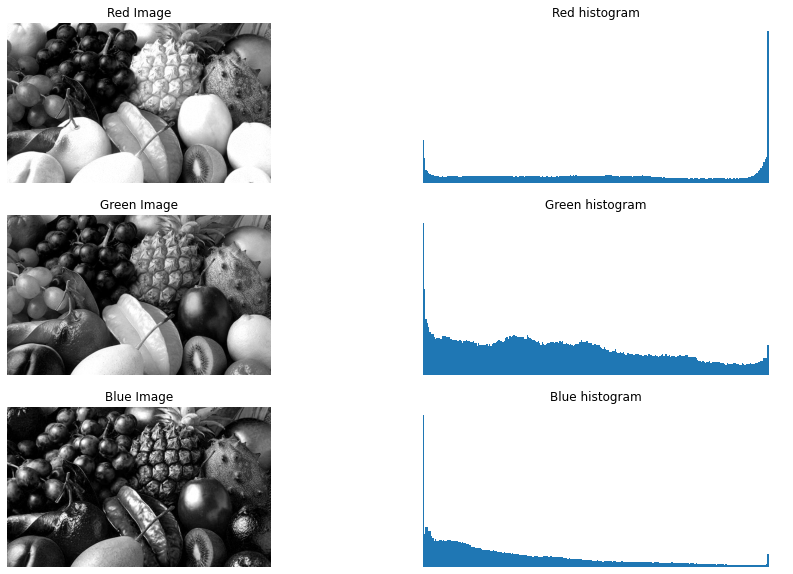

In [14]:
fig, ax= plt.subplots(3, 2, figsize= [15, 10])

plt.sca(ax[0, 0])
plt.imshow(red, cmap= 'gray')
plt.title('Red Image')
plt.axis('off')

plt.sca(ax[0, 1])
plt.hist(red.ravel(), bins=256)
plt.title('Red histogram')
plt.axis('off')

plt.sca(ax[1, 0])
plt.imshow(green, cmap= 'gray')
plt.title('Green Image')
plt.axis('off')

plt.sca(ax[1, 1])
plt.hist(green.ravel(), bins=256)
plt.title('Green histogram')
plt.axis('off')

plt.sca(ax[2, 0])
plt.imshow(blue, cmap= 'gray')
plt.title('Blue Image')
plt.axis('off')

plt.sca(ax[2, 1])
plt.hist(blue.ravel(), bins=256)
plt.title('Blue histogram')
plt.axis('off')

plt.show()          # اللي طلعت فهلاقي ان اللون الاخضر اكتر لون في الصوره ويليه الاحمر ثم الازرق Histograms فلو صيت علي ال

### Histogram Thresholding

- #### partitioning an image into a `foreground` and `background`, By making it `black` and `white`
- #### We do that by setting each pixel to:

    - #### `1 (white)` if pixel `>` thresh value
    - #### `0 (black)` if pixel `<` thresh value
    
- #### `threshhold` يعني انا ممكن اقسم الصوره لنصين بحيث تبقي الخلفيه بيضاء والمقدمه سوداء او العكس يعني وبعمل ده عن طريق اني بحدد رقم كدا بسميه
- #### ده بيبقي رقم بختاره انا بقول لو البيكسل درجه لونها اقل من الرقم ده يقوم يحولي البكسل دي سوداء ولو درجه لونها أكبر يحولهالي بيضاء `threshhold` ال
- #### وبكده أكون حولت الصوره كلها لابيض واسود بس يعني تخلصت من البكسلات اللي كان لونها اسود خفيف او ابيض خفيف لا قلبتهم كلهم يا أسود اوي يا ابيض اوي

___
### `[ Only from grayscale images ]` <------ `Grayscale` إلا اما احولها ل `Thresholding` هام جداً --- ماينفعش اشتغل علي الصوره 
### `Object Segmentation` & `Object Detection` تعتبر اسهل طريقه لعمل [ Histogram Thresholding ] طريقه ال
___

In [15]:
# أنا هنا هخلي الخلفيه بيضاء والمقدمه سوداء

chess_image= plt.imread('Image Processing Images//chapter 1//bw.jpg')
chess_image_grayscale= color.rgb2gray(chess_image)
# قيم البكسلات بتبقي مابين 0 ل 1 حيث 0 يعني سوداء و 1 يعني بيضاء grayscale أنا لما باجي احول الصوره ل
# اللي اخده لازم يبقي رقم مابين ال 0 و 1 threshold فبالتالي ال

# the optimal threshold value
thresh = 0.49

# Apply thresholding to the image
binary = chess_image_grayscale > thresh    
         # False والاقل هتبقي True هتبقي thresh يعني هيعدي علي المصفوفه بتاعت الصوره والقيم اللي أكبر من ال boolean أنا هنا بعمل

In [16]:
print(binary)

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True False False ...  True  True  True]
 [False False False ...  True  True  True]
 [ True False False ...  True  True  True]]


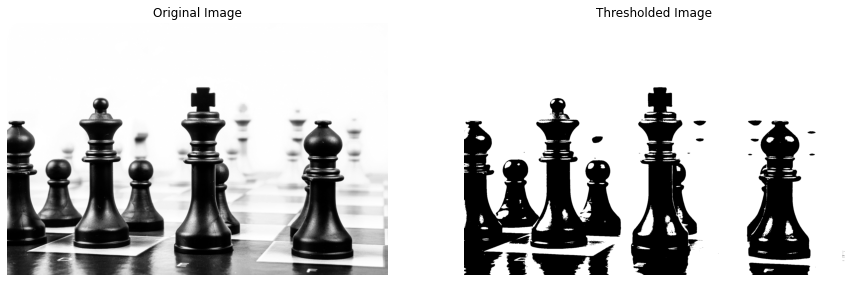

In [17]:
fig, ax= plt.subplots(1, 2, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(chess_image_grayscale, cmap= 'gray')
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(binary, cmap= 'gray')
plt.title('Thresholded Image')
plt.axis('off')

plt.show()

In [18]:
# أنا هنا هعكس بقي هخلي الخلفيه سوداء والمقدمه بيضاء

# the optimal threshold value
thresh = 0.49

# Apply thresholding to the image
inverted_binary = chess_image_grayscale <= thresh    
         # False والاقل هتبقي True هتبقي thresh يعني هيعدي علي المصفوفه بتاعت الصوره والقيم اللي أكبر من ال boolean أنا هنا بعمل

In [19]:
print(inverted_binary)

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False  True  True ... False False False]
 [ True  True  True ... False False False]
 [False  True  True ... False False False]]


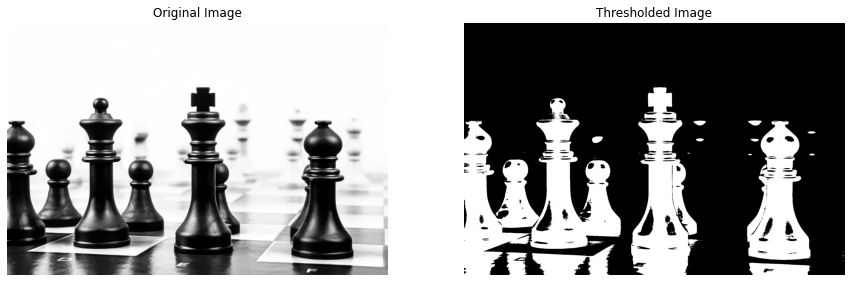

In [20]:
fig, ax= plt.subplots(1, 2, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(chess_image_grayscale, cmap= 'gray')
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(inverted_binary, cmap= 'gray')
plt.title('Thresholded Image')
plt.axis('off')

plt.show()

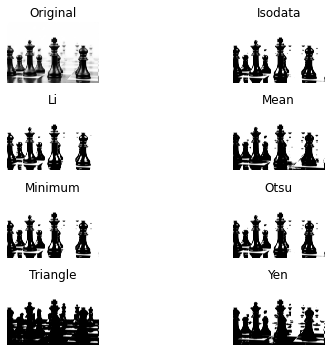

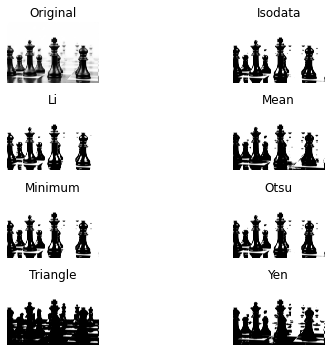

In [21]:
# threshold filters وهتعملي عليها جميع ال grayscale فانكشن بديها صوره تكون
from skimage.filters import try_all_threshold

# Obtain all the resulting images
fig, ax = try_all_threshold(chess_image_grayscale, verbose=False)

fig

In [22]:
# اللي عايز اعمله علي الصوره وبدي للاسم ده الصوره threshold بتاع فلتر معين بستدعي اسم ال [threshold] انا هنا لو عايز ادي الصوره
# اللي لو طبقته علي الصوره بتاعتي هيجبلي درجه الفلتر ده threshold فهتجبلي ال
from skimage.filters import threshold_otsu

# the optimal threshold value
thresh = threshold_otsu(chess_image_grayscale)

# Apply thresholding to the image
binary_global = chess_image_grayscale > thresh

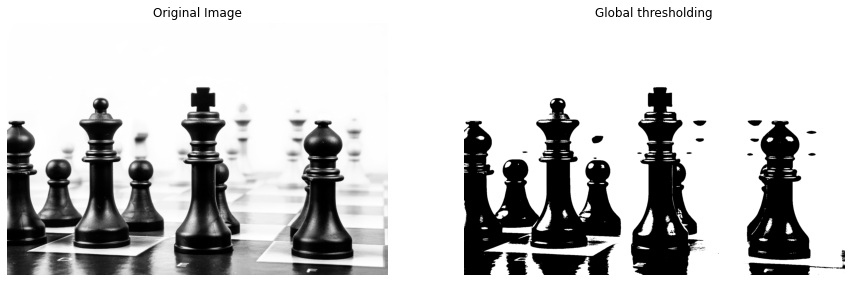

In [23]:
fig, ax= plt.subplots(1, 2, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(chess_image_grayscale, cmap= 'gray')
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(binary_global, cmap= 'gray')
plt.title('Global thresholding')
plt.axis('off')

plt.show()

In [24]:
# اللي عايز اعمله علي الصوره وبدي للاسم ده الصوره threshold بتاع فلتر معين بستدعي اسم ال [threshold] انا هنا لو عايز ادي الصوره
# اللي لو طبقته علي الصوره بتاعتي هيجبلي درجه الفلتر ده threshold فهتجبلي ال
from skimage.filters import threshold_yen

# the optimal threshold value
thresh = threshold_yen(chess_image_grayscale)

# Apply thresholding to the image
binary_yen = chess_image_grayscale > thresh

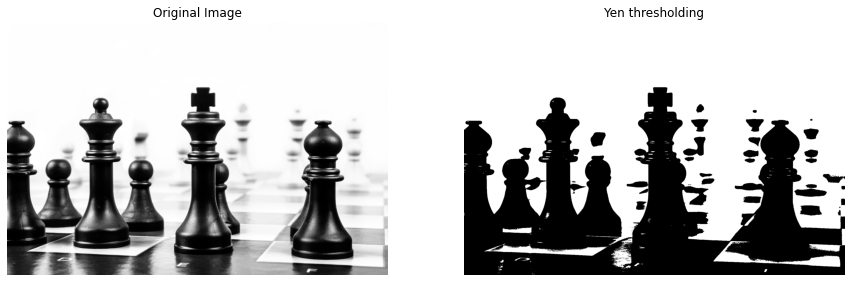

In [25]:
fig, ax= plt.subplots(1, 2, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(chess_image_grayscale, cmap= 'gray')
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(binary_yen, cmap= 'gray')
plt.title('Yen thresholding')
plt.axis('off')

plt.show()

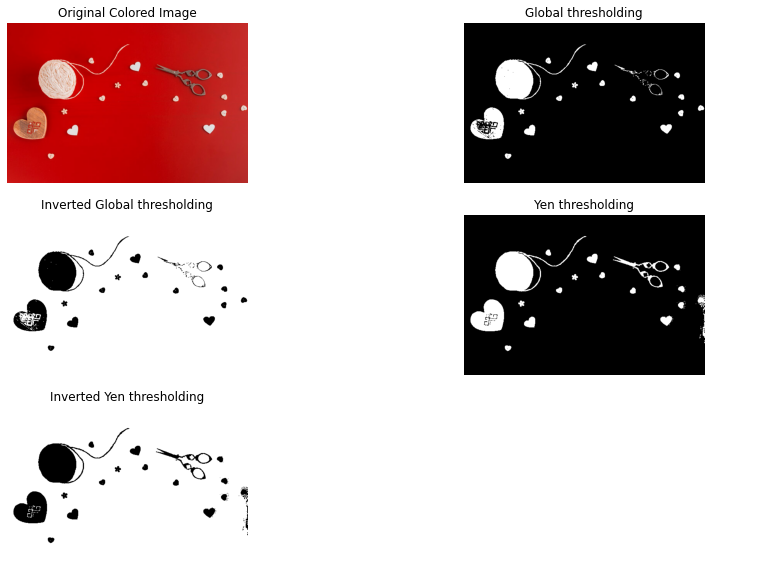

In [26]:
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu, threshold_yen

tools_image= plt.imread('Image Processing Images//chapter 1//shapes52.jpg')
tools_image_gray= rgb2gray(tools_image)

# Thresholds
thresh_otsu= threshold_otsu(tools_image_gray)
thresh_yen = threshold_yen(tools_image_gray)

# Apply
binary_otsu= tools_image_gray > thresh_otsu
binary_otsu_inverted= tools_image_gray <= thresh_otsu
binary_yen= tools_image_gray > thresh_yen
binary_yen_inverted= tools_image_gray <= thresh_yen


fig, ax= plt.subplots(3, 2, figsize= [15, 10])  

plt.sca(ax[0,0])
plt.imshow(tools_image)
plt.title('Original Colored Image')
plt.axis('off')

plt.sca(ax[0,1])
plt.imshow(binary_otsu, cmap= 'gray')
plt.title('Global thresholding')
plt.axis('off')

plt.sca(ax[1,0])
plt.imshow(binary_otsu_inverted, cmap= 'gray')
plt.title('Inverted Global thresholding')
plt.axis('off')

plt.sca(ax[1,1])
plt.imshow(binary_yen, cmap= 'gray')
plt.title('Yen thresholding')
plt.axis('off')

plt.sca(ax[2,0])
plt.imshow(binary_yen_inverted, cmap= 'gray')
plt.title('Inverted Yen thresholding')
plt.axis('off')

plt.sca(ax[2,1])        # Not printing the last figure
plt.axis('off')

plt.show()

____
# `Chapter 2` -- Filters, Contrast, Transformation and Morphology
____

## `1`. Filters

### Importance of Filters:
- #### `Enhancing` an image
- #### `Emphasize` or `remove` features
- #### `Smoothing`
- #### `Sharpening`
- #### `Edge detection`

___
### `Edge detection`

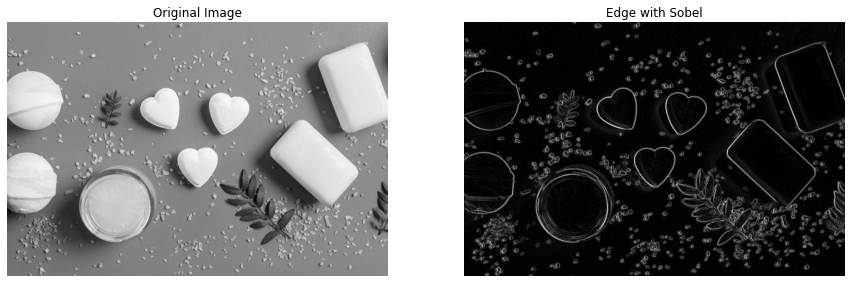

In [27]:
from skimage.filters import sobel                  # we use [sobel filter] for [edge detection]
from skimage.color import rgb2gray

soap_image= plt.imread('Image Processing Images//chapter 2//soap_image.jpg')
soap_image_gray= rgb2gray(soap_image)

# Apply edge detection filter
edge_sobel = sobel(soap_image_gray)


fig, ax= plt.subplots(1,2, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(soap_image_gray, cmap= 'gray')
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(edge_sobel, cmap= 'gray')
plt.title('Edge with Sobel')
plt.axis('off')

plt.show()

___
### `Smoothing`

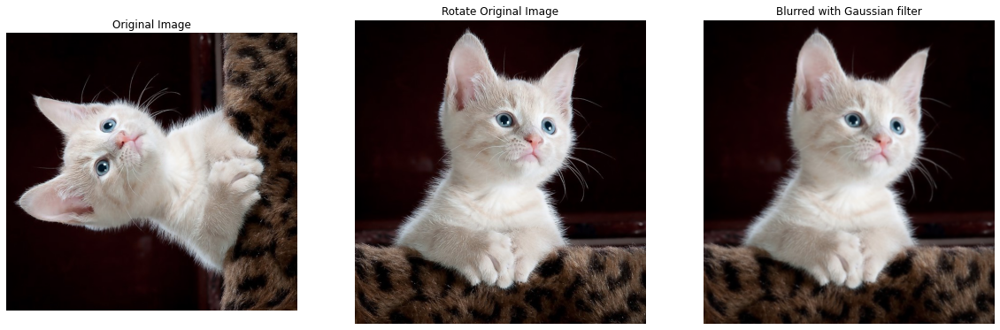

In [28]:
from skimage.filters import gaussian           # we use [gaussian filter] to [Blurred images]  يعني بنعمها شويه او بنشبرها شويه

image_cat= plt.imread('Image Processing Images//chapter 2//image_cat.jpg')
image_cat_rotate= np.rot90(image_cat, 3)         # بتلف الصور عكس عقارب الساعه فلما بديها رقم زي 3 كدا فهو هيلف 90 درجه عكس عقارب الساعه 3 مرات rot90

# Apply gaussian filter
gaussian_image = gaussian(image_cat_rotate, multichannel=True)

fig, ax= plt.subplots(1,3, figsize= [20, 10])

plt.sca(ax[0])
plt.imshow(image_cat)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(image_cat_rotate)
plt.title('Rotate Original Image')
plt.axis('off')

plt.sca(ax[2])
plt.imshow(gaussian_image)
plt.title('Blurred with Gaussian filter')
plt.axis('off')

plt.show()

## `2`. Contrast enhancement

### There are 2 Types of [ Contrast enhancement ]:
- #### Histogram equalization
- #### Adaptive histogram equalization   --- [The Best]

<ipython-input-29-659db5e6799c>:6: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  image_aerial_gray= rgb2gray(image_aerial)


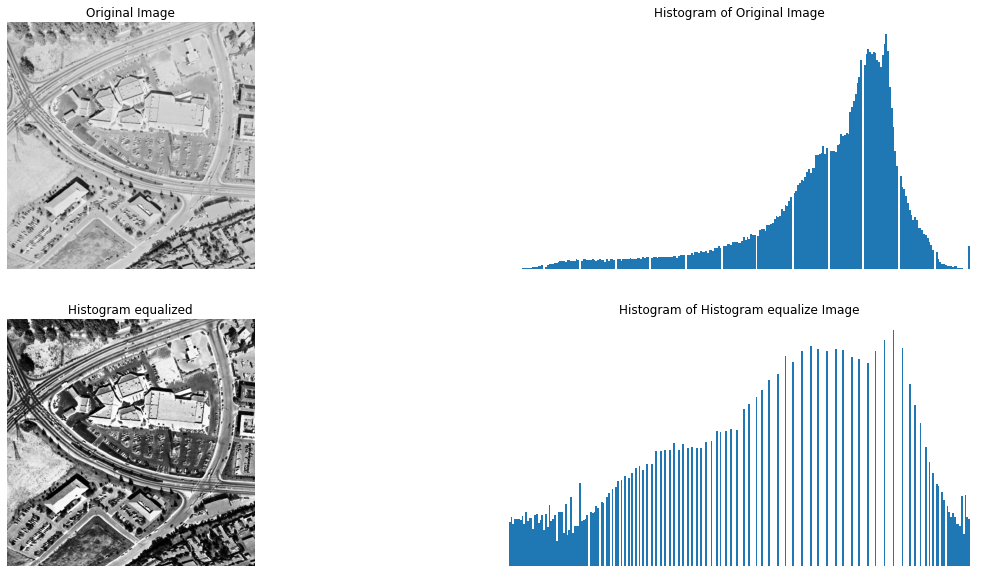

In [29]:
# Histogram equalization:
from skimage import exposure
from skimage.color import rgb2gray

image_aerial= plt.imread('Image Processing Images//chapter 2//image_aerial.tiff')
image_aerial_gray= rgb2gray(image_aerial)

# Histogram equalize image
image_Hist_equalize = exposure.equalize_hist(image_aerial_gray)


fig, ax= plt.subplots(2,2, figsize= [20, 10])

plt.sca(ax[0,0])
plt.imshow(image_aerial_gray, cmap= 'gray')
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[0,1])
plt.hist(image_aerial_gray.ravel(), bins= 256)
plt.title('Histogram of Original Image')
plt.axis('off')

plt.sca(ax[1,0])
plt.imshow(image_Hist_equalize, cmap= 'gray')
plt.title('Histogram equalized')
plt.axis('off')

plt.sca(ax[1,1])
plt.hist(image_Hist_equalize.ravel(), bins= 256)
plt.title('Histogram of Histogram equalize Image')
plt.axis('off')

plt.show()              # حصل توزيع في شده الصوره Contrast بتوع الصورتين هلاقي ان لما عملت Histograms لو جيت بصيت في ال

<ipython-input-30-dcee02ebacb1>:6: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  image_aerial_gray= rgb2gray(image_aerial)


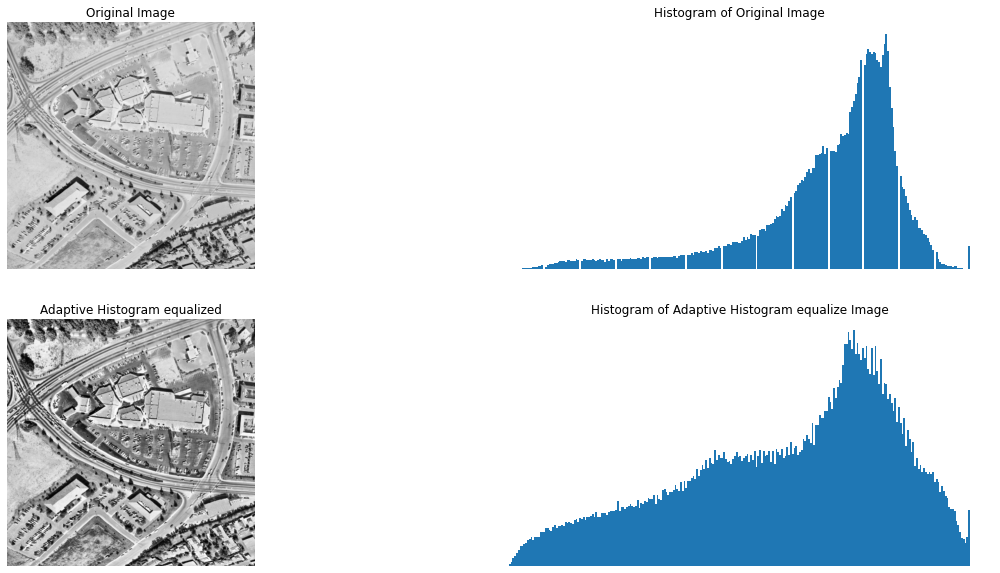

In [30]:
# Adaptive histogram equalization:
from skimage import exposure
from skimage.color import rgb2gray

image_aerial= plt.imread('Image Processing Images//chapter 2//image_aerial.tiff')
image_aerial_gray= rgb2gray(image_aerial)

# Histogram equalize image
image_AdaptHist_equalize = exposure.equalize_adapthist(image_aerial_gray)


fig, ax= plt.subplots(2,2, figsize= [20, 10])

plt.sca(ax[0,0])
plt.imshow(image_aerial_gray, cmap= 'gray')
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[0,1])
plt.hist(image_aerial_gray.ravel(), bins= 256)
plt.title('Histogram of Original Image')
plt.axis('off')

plt.sca(ax[1,0])
plt.imshow(image_AdaptHist_equalize, cmap= 'gray')
plt.title('Adaptive Histogram equalized')
plt.axis('off')

plt.sca(ax[1,1])
plt.hist(image_AdaptHist_equalize.ravel(), bins= 256)
plt.title('Histogram of Adaptive Histogram equalize Image')
plt.axis('off')

plt.show()              # حصل توزيع في شده الصوره Contrast بتوع الصورتين هلاقي ان لما عملت Histograms لو جيت بصيت في ال

## `3`. Transformations

### `Rotate Image`:

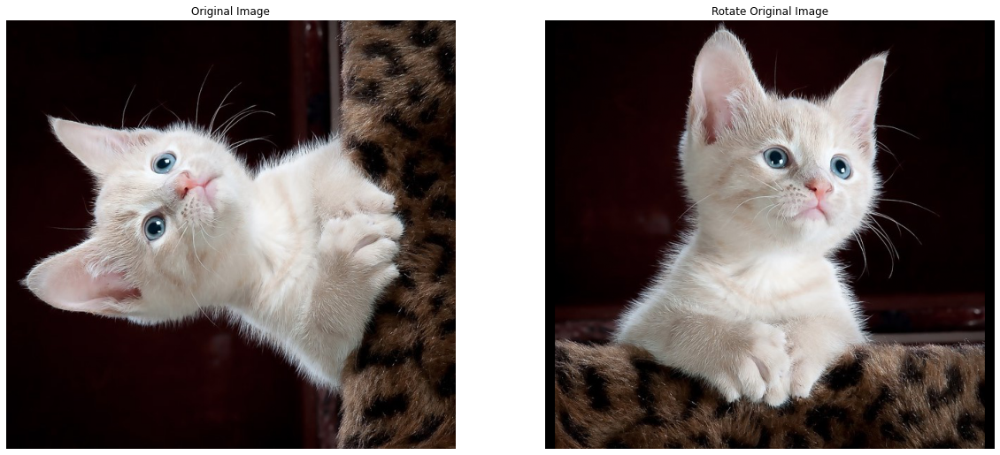

In [31]:
from skimage.transform import rotate

image_cat= plt.imread('Image Processing Images//chapter 2//image_cat.jpg')
image_rotated = rotate(image_cat, -90)    # Rotate the image 90 degrees clockwise (مع عقارب الساعه بنعمل الدرجه بالسالب)


fig, ax= plt.subplots(1,2, figsize= [20, 10])

plt.sca(ax[0])
plt.imshow(image_cat)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(image_rotated)
plt.title('Rotate Original Image')
plt.axis('off')

plt.show()


### `Rescaling`:

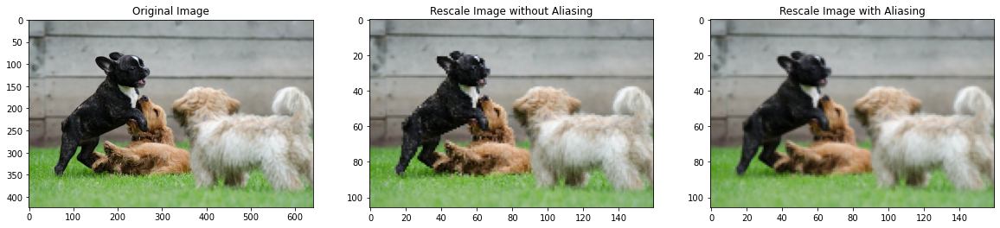

In [32]:
from skimage.transform import rescale

dogs_image= plt.imread('Image Processing Images//chapter 2//dogs_banner.jpg')

# Rescale the image to be 4 times smaller (يعني اصغر الصوره لربع حجمها)
image_rescaled_without_aliasing= rescale(dogs_image, 1/4, anti_aliasing= False, multichannel=True)
image_rescaled_with_aliasing   = rescale(dogs_image, 1/4, anti_aliasing= True, multichannel=True)


fig, ax= plt.subplots(1,3, figsize= [20, 10])

plt.sca(ax[0])
plt.imshow(dogs_image)
plt.title('Original Image')

plt.sca(ax[1])
plt.imshow(image_rescaled_without_aliasing)
plt.title('Rescale Image without Aliasing')

plt.sca(ax[2])
plt.imshow(image_rescaled_with_aliasing)
plt.title('Rescale Image with Aliasing')

plt.show()

In [33]:
# لو جيت بصيت علي حجمها هلاقيه فعلا قل للربع

print('Original Image: ', soap_image.shape)
print('Rescaled Image: ', image_rescaled_without_aliasing.shape)

Original Image:  (417, 626, 3)
Rescaled Image:  (106, 160, 3)


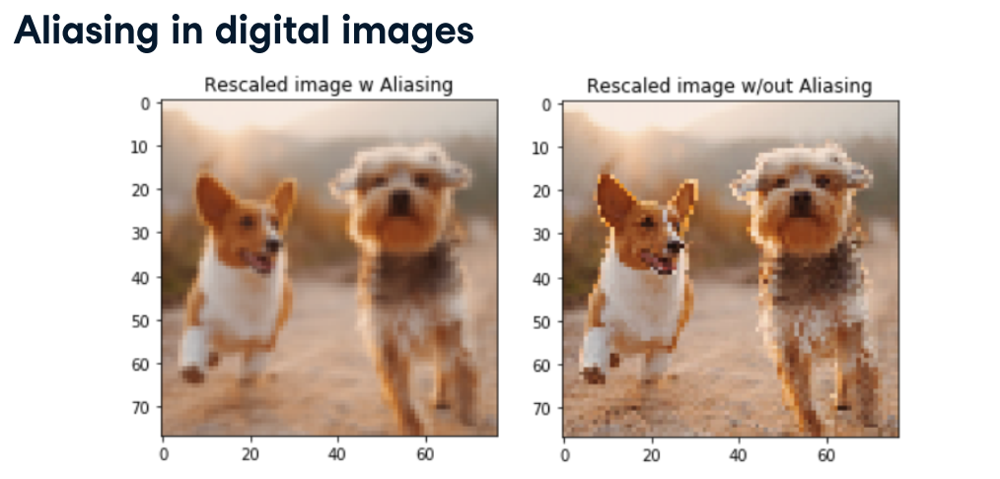

### `Resizing`

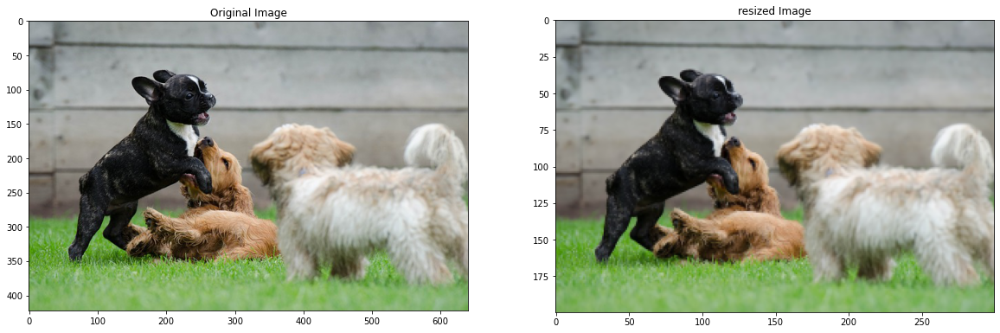

In [34]:
from skimage.transform import resize

dogs_image= plt.imread('Image Processing Images//chapter 2//dogs_banner.jpg')

# Height and width to resize
height = 200
width = 300
image_resized = resize(dogs_image, (height, width))


fig, ax= plt.subplots(1,2, figsize= [20, 10])

plt.sca(ax[0])
plt.imshow(dogs_image)
plt.title('Original Image')

plt.sca(ax[1])
plt.imshow(image_resized)
plt.title('resized Image')

plt.show()

In [35]:
# لو جيت بصيت علي حجمها هلاقيه فعلا قل زي ما انا حددت

print('Original Image: ', soap_image.shape)
print('Rescaled Image: ', image_resized.shape)

Original Image:  (417, 626, 3)
Rescaled Image:  (200, 300, 3)


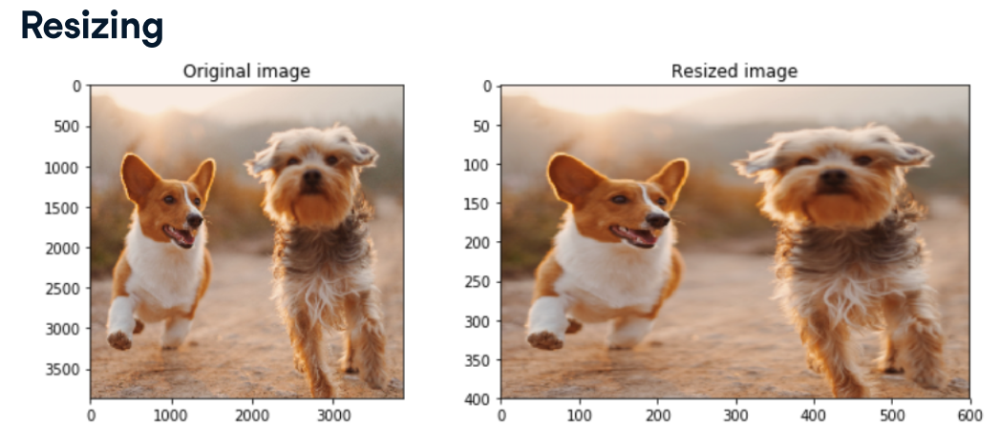

## `4`. Morphology:

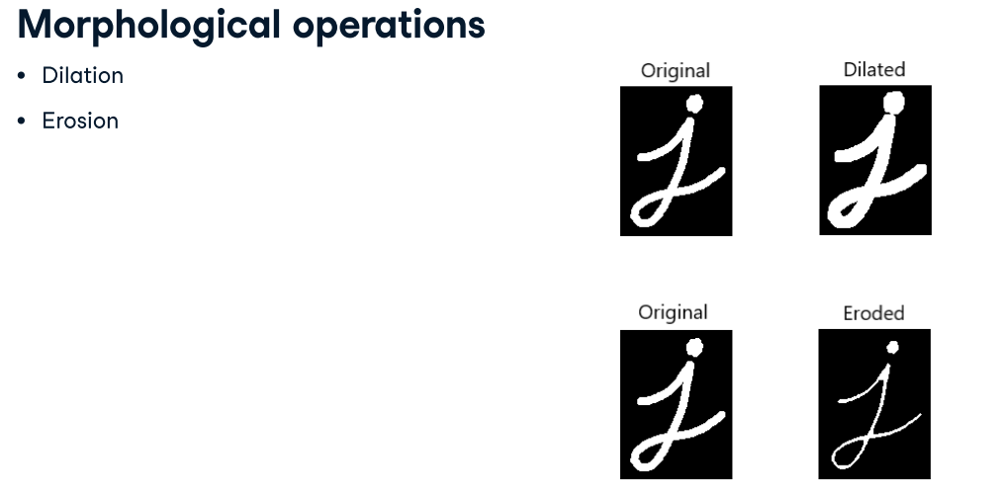

In [36]:
from skimage import morphology

square = morphology.square(4)               # create array [4*4 shape]
rectangle = morphology.rectangle(4, 2)      # create array [4 rows , 2 columns]

print(square)
print('============')
print(rectangle)

[[1 1 1 1]
 [1 1 1 1]
 [1 1 1 1]
 [1 1 1 1]]
[[1 1]
 [1 1]
 [1 1]
 [1 1]]


### `Erosion` --- أنكماش

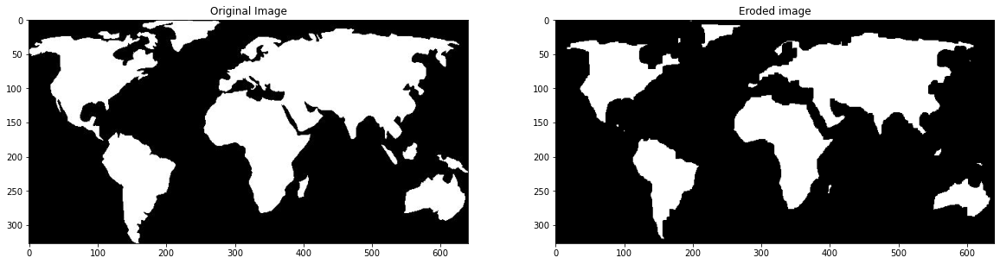

In [37]:
from skimage import morphology

world_image= plt.imread('Image Processing Images//chapter 2//world_image_binary.jpg')

selem = morphology.rectangle(12,6)
eroded_image = morphology.binary_erosion(world_image, selem= selem)


fig, ax= plt.subplots(1,2, figsize= [20, 10])

plt.sca(ax[0])
plt.imshow(world_image, cmap= 'gray')
plt.title('Original Image')

plt.sca(ax[1])
plt.imshow(eroded_image, cmap= 'gray')
plt.title('Eroded image')

plt.show()

### `Dilation` --- تضخم

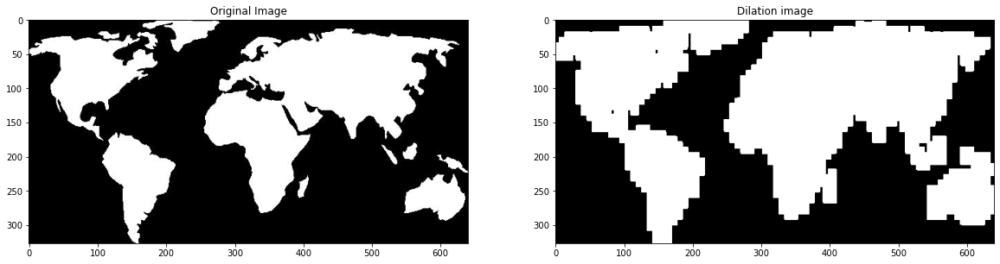

In [38]:
from skimage import morphology

world_image= plt.imread('Image Processing Images//chapter 2//world_image_binary.jpg')

selem = morphology.rectangle(12,6)
eroded_image = morphology.binary_dilation(world_image, selem= selem)


fig, ax= plt.subplots(1,2, figsize= [20, 10])

plt.sca(ax[0])
plt.imshow(world_image, cmap= 'gray')
plt.title('Original Image')

plt.sca(ax[1])
plt.imshow(eroded_image, cmap= 'gray')
plt.title('Dilation image')

plt.show()

____
# `Chapter 3` -- Image restoration, Noise, Segmentation and Contours
____

## `1`. Image restoration:

### Tasks of Image restoration:
- #### `Fixing damaged images` --- اصلاح الصور التالفه
- #### `Text removing` --- ازاله النصوص اللي علي الصوره
- #### `Logo removing` --- ازاله اي لوجو من علي الصوره
- #### `Object removing` --- ازاله اي رسمه اضافيه في الصوره
___
- #### `Inpainting` --- Reconstructing lost parts of images by looking at the non-damaged regions  
    -- معالجه الاجزاء التالفه في الصوره عن طريق انه يشوف الحتت السليمه وياخدها ويكمل بيها الاجزاء التالفه مع اخذ في الاعتبار تناسق الالوان
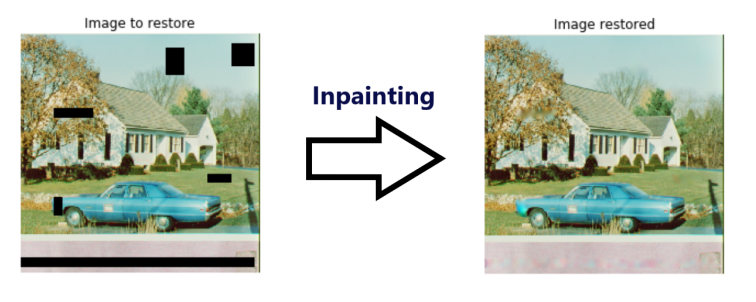
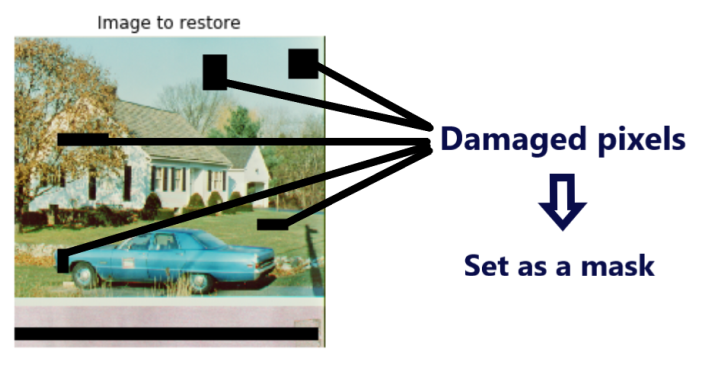
___

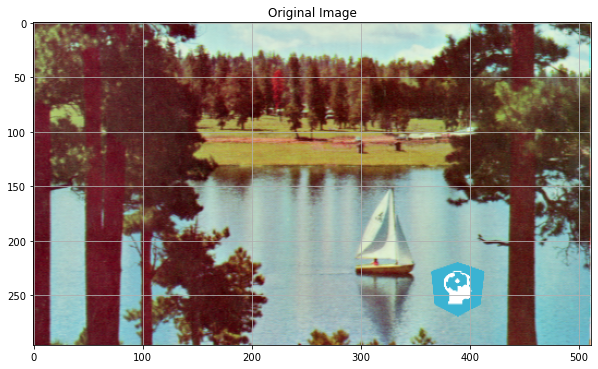

In [39]:
# هنا انا بعرفك ازاي بنشيل اي حاجه موجوده في الصوره الاصليه بتاعتنا عشان نرجعها زي ماهي يعني نعملها استعاده بدون تشوهات
# أول حاجه احنا هنجيب مصفوفه الارقام بتاعت الصوره اللي فيها مشاكل دي وأحدد الاربع احداثيات بتوع المنطقه اللي عايز اعالجها دي
# فالمنطقه الواحده عايزه 4 احداثيات انما لو الصوره فيها اكتر من منطقه فيها مشكله فبالتالي لكل منطقه هحدد 4 الاحداثيات بتاعتها
# grid تب ازاي احدد ال 4 احداثيات للمنطقه اللي عايز اعالجها؟  قالك عن طريق اني هعرض الصوره المشوهه دي وهعرض معاها حاجه اسمها 
# دي اللي بتبقي شبكه كدا علي الصوره واللي عن طريقها بحاول احدد الاحداثيات بتاعت المنطقه اللي عايز اعالجها بعنيا grid ال
# يعني المنطقه المشوهه دي بدايتها منين من فوق ونهايتها ايه من تحت height ال 4 احداثيات دول بيبقوا كألاتي : أول احداثيين بيبقوا بتوع ال
# عرض المنطقه دي يعني  Weight فبعد ما بجيب ارتفاع المنطقه من فوق وتحت .. هروح بقي احدد الاحداثيين التانيين بتوع ال 
# بدايتها منين من اليمين ونهايتها منين من الشمال ... وبكده بكون حددت ارتفاعها منين لفين وعرضها منين لفين
# بروح بقي اعمل الماسك للصوره دي بمعني اني بروح احول مصفوفه الصوره دي كلها بأصفار يعني بخلي البكسلات بتاعت الصوره كلها بأسود
# بعد مابعمل الماسك للصوره وبخلي البكسلات بتاعتها كلها بأسود بروح بقي ادي للماسك ال 4 احداثيات بتوع كل منطقه مشوهه عندي
# وبقول للماسك حولي الاحداثيات دي كلها بالأبيض وده عن طريق اني بخلي الماسك يحطلي مكان الاحداثيات دي 1 ومعني 1 يعني بكسلات بيضاء
# فبكده بقي عندي ماسك الصوره كله بكسلات سوداء ماعدا المناطق اللي محتاجه تتعالج بقت بكسلات بيضاء وبكده هكون حددت المناطق دي
# inpaint.inpaint_biharmonic أسمها skimage.restoration جميله من مكتبه ال function وفي النهايه في
# والفانكشن دي بقي كل اللي بعمله اني بديها الصوره الاصليه المشوهه والماسك اللي انا عاملته ده وهي هتعالج في الصوره الاصليه المناطق اللي في الماسك ده  
defect_image= plt.imread('Image Processing Images//chapter 3//4.2.06_w_logo_2_2.png')

fig, ax = plt.subplots(figsize=(10, 8))
plt.imshow(defect_image)
plt.title('Original Image')
plt.grid(True)
plt.show()

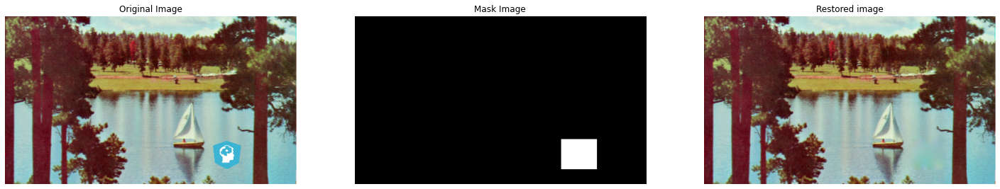

In [40]:
from skimage.restoration import inpaint

# Obtain the mask
def get_mask(image):
    ''' Creates mask with logo defect region '''
    mask = np.zeros(image.shape[:-1])  # بقوله هنا اعملي مصفوفه كلها اصفار بنفس بكسلات الصوره الاصليه يعني نفس الارتفاع والعرض
    mask[217:270, 362:425] = 1         #  دول كدا ال 4 احداثيات فهنا بقوله ارتفاع المنطقه المشوهه من البكسل 217 إلي البكسل 270
    return mask                        #  وعرض المنطقه المشوهه من البكسل 362 إلي البكسل 425
mask = get_mask(defect_image)

# Apply inpainting to the damaged image using the mask
restored_image = inpaint.inpaint_biharmonic(defect_image, mask, multichannel=True)


fig, ax= plt.subplots(1,3, figsize= [25, 15])

plt.sca(ax[0])
plt.imshow(defect_image)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(mask, cmap= 'gray')
plt.title('Mask Image')
plt.axis('off')

plt.sca(ax[2])
plt.imshow(restored_image)
plt.title('Restored image')
plt.axis('off')

plt.show()

In [41]:
# data.astronaut()

## `2`. Noise

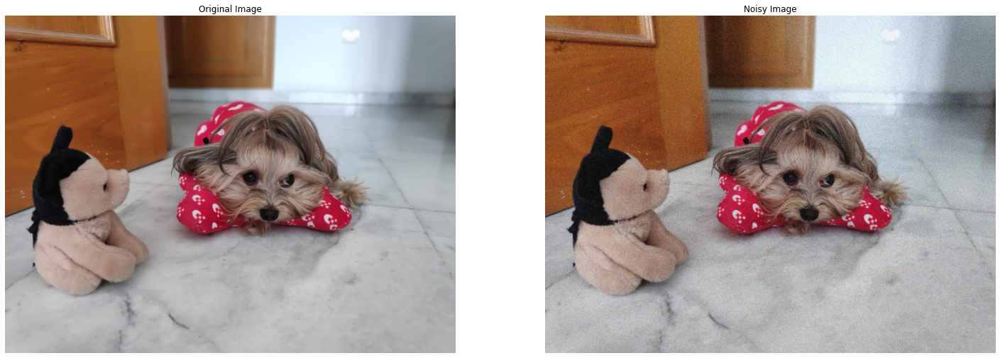

In [42]:
# للصوره وهنشيلها تحت Noise أحنا هنا بنضيف 
from skimage.util import random_noise

dog_image= plt.imread('Image Processing Images//chapter 3//miny.jpeg')

# Add noise to the image
noisy_image = random_noise(dog_image)


fig, ax= plt.subplots(1,2, figsize= [25, 15])

plt.sca(ax[0])
plt.imshow(dog_image)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(noisy_image)
plt.title('Noisy Image')
plt.axis('off')

plt.show()

### Denoising types:  ---------- noise دي كده انواع الالجورزمات اللي بتشيل أي
- #### Total variation (TV).
- #### Bilateral.
- #### Wavelet denoising.
- #### Non-local means denoising.

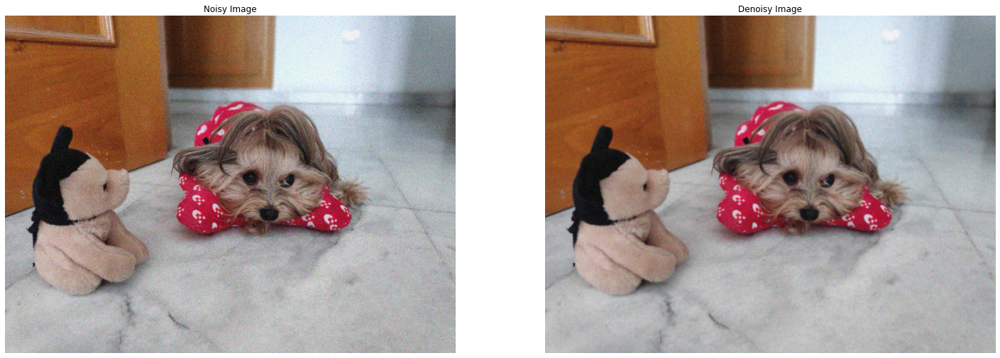

In [106]:
# Using [total variation (TV)] Denoising:
from skimage.restoration import denoise_tv_chambolle

# Apply total variation filter denoising
denoised_image = denoise_tv_chambolle(noisy_image, multichannel=True)


fig, ax= plt.subplots(1,2, figsize= [25, 15])

plt.sca(ax[0])
plt.imshow(noisy_image)
plt.title('Noisy Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(denoised_image)
plt.title('Denoisy Image')
plt.axis('off')

plt.show()

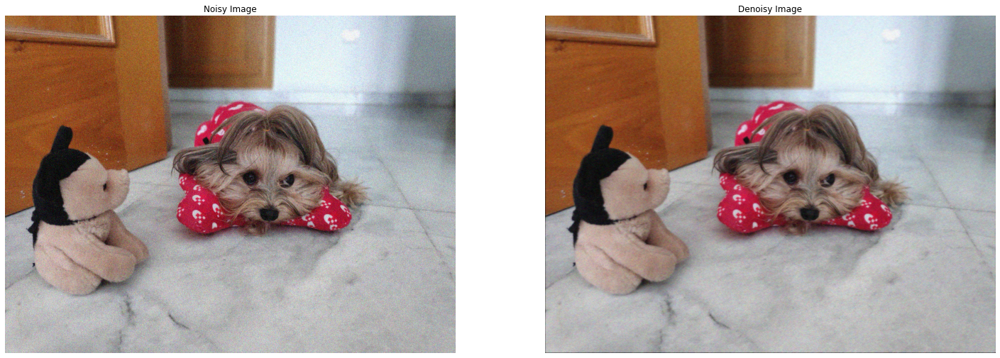

In [44]:
# Using [Bilateral] Denoising:
from skimage.restoration import denoise_bilateral

# Apply total variation filter denoising
denoised_image = denoise_bilateral(noisy_image, multichannel=True)


fig, ax= plt.subplots(1,2, figsize= [25, 15])

plt.sca(ax[0])
plt.imshow(noisy_image)
plt.title('Noisy Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(denoised_image)
plt.title('Denoisy Image')
plt.axis('off')

plt.show()

## `3`. Superpixels & segmentation

___
### Benefits of superpixels ---------  بتجبلي من الصوره البكسلات الاساسيه اللي بتبين ملامح الصوره عن باقي بكسلات الصوره
- #### More meaningful regions
- #### Computational e)ciency

____
### Segmentation ------------ superpixel  ال Segment أنا محتاج اني اقسم الصوره تقسيمات بعدد معين انا اللي بحدده بحيث اطلع من كل
#### `2 Types`:
- #### Supervised
- #### Unsupervised

<ipython-input-120-3a30411c6a2d>:9: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  defualt_segments = slic(coffee_image)      # [n_segments= 100] اللي هو defualt number of segments أنا هنا هقسم الصوره بال
<ipython-input-120-3a30411c6a2d>:12: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  segmented_image = label2rgb(defualt_segments, coffee_image, kind='avg')      # suberpixels هنا هو هيحط الصوره المتقسمه 100 تقسيمه دي علي الصوره الاصليه وهيقارن وهيطلع ال
<ipython-input-120-3a30411c6a2d>:14: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  segm

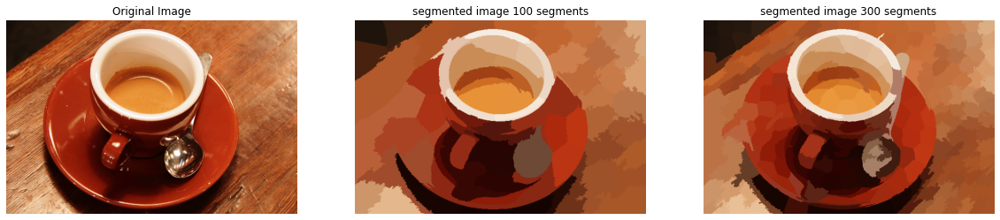

In [120]:
# Unsupervised segmentation [Simple Linear Iterative Clustering (SLIC)]
from skimage.segmentation import slic
from skimage.color import label2rgb
from skimage import data

coffee_image= data.coffee()

# Obtain the segments
defualt_segments = slic(coffee_image)      # [n_segments= 100] اللي هو defualt number of segments أنا هنا هقسم الصوره بال

# Put segments on top of original image to compare
segmented_image = label2rgb(defualt_segments, coffee_image, kind='avg')      # suberpixels هنا هو هيحط الصوره المتقسمه 100 تقسيمه دي علي الصوره الاصليه وهيقارن وهيطلع ال 

segments_300= slic(coffee_image, n_segments= 300)
segmented_300_image= label2rgb(segments_300, coffee_image, kind='avg')



fig, ax= plt.subplots(1,3, figsize= [20, 20])

plt.sca(ax[0])
plt.imshow(coffee_image)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(segmented_image.astype('uint8'))        # وانا بعرضها مش عارف ليه [uint8] في مشكله هنا بيبقي لازم احول الصوره ل
plt.title('segmented image 100 segments')
plt.axis('off')

plt.sca(ax[2])
plt.imshow(segmented_300_image.astype('uint8'))    # وانا بعرضها مش عارف ليه [uint8] في مشكله هنا بيبقي لازم احول الصوره ل
plt.title('segmented image 300 segments')
plt.axis('off')
 
plt.show()       # فأنا كدا بزدو عدد تقسيمات الصوره [n_segments] طبعا انا كل ما بزود عدد ال
                 # بتزيد فكل ما ملامح الصوره بتزيد أكتر وطبعاً العكس صحيح [superpixels] كل ما ال [segments] فكل مابزود ال [superpixel] فبالتالي بيطلعلي من كل تقسيمه ال
    

## `4`. contours

____
### Why using Contours?
- #### `Measure size`
- #### `Classify shapes`
- #### `Determine the number of objects`

<ipython-input-127-db48f464e174>:8: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  image = rgb2gray(dices_image)


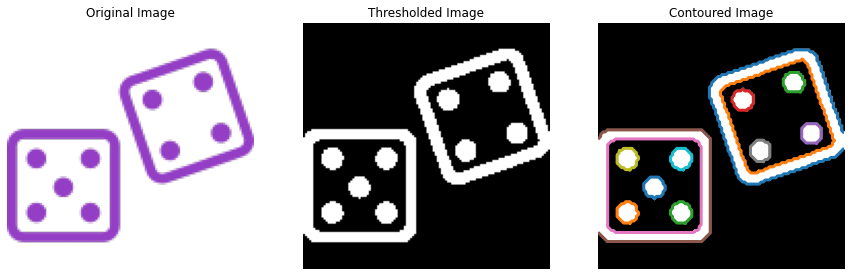

In [127]:
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage import measure


dices_image= plt.imread('Image Processing Images//chapter 3//dices.png')
# Must the image be grayscale (2D)
image = rgb2gray(dices_image)

# the optimal threshold value
thresh = threshold_otsu(image)

# Apply thresholding to the image
thresholded_image = image > thresh

# Find contours at a constant value of 0.8
contours = measure.find_contours(thresholded_image, 0.8)

fig, ax= plt.subplots(1,3, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(dices_image, cmap= 'gray')
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(thresholded_image, cmap= 'gray')
plt.title('Thresholded Image')
plt.axis('off')

plt.sca(ax[2])
plt.imshow(thresholded_image, cmap= 'gray')

for n, contour in enumerate(contours):
    plt.plot(contours[n][:, 1], contours[n][:, 0], linewidth=3)       # linewidth --> عرض الخط
    
plt.title('Contoured Image')
plt.axis('off')
plt.show()

___
### يعني كام نقطه داخل كل قالب ضومنه من ده يعني اجسب عددهم كلهم dot أنا ممكن كمان اعمل حاجه جميله جداً اني احسب انا عندي كام
### قد ايه contour بتاع كل shape عندي واشوف ال contours وده سهل جدا عن طريق اني الوب علي ال
### contours بتوع كل ال shape موجوده لانها اقل حجم فعلا في الرسمه فبالتالي لما اجيب ال contours هتبقي اقل أحجام dots ومن البديهي كدا ال
### اللي جوه قوالب الضومنه dots دول هيبقوا بتوع ال shapes هكون عارف ان اقل

In [128]:
# Create list with the shape of each contour
shape_contours = [cnt.shape[0] for cnt in contours]
shape_contours          # بتوع الضومنه لانهم اقل حجم بكسلات dots فأكيد دول بتوع ال (41, 43 & 45 Pixels) هي ال shapes فهنا اقل 

[255, 221, 43, 45, 41, 173, 181, 43, 45, 45, 45, 45, 45]

In [130]:
# Set 50 as the maximum size of the dots shape
max_dots_shape = 50            # هم اللي اقل من ال 50 dots فأنا هلوب علي كل اللي اقل من 50 لاني عارف ان ال

# Count dots in contours excluding bigger than dots size,      # dots الاقل من 50 اللي هم ال shapes فهنا هيجبلي ال
dots_contours = [cnt for cnt in contours if cnt.shape[0] < max_dots_shape]   

# Print the dice's number
print("Dice's dots number: {}. ".format(len(dots_contours)))   # وفي الاخر بجيب عددهم

Dice's dots number: 9. 


## Constant level value
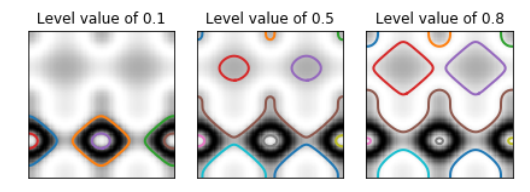

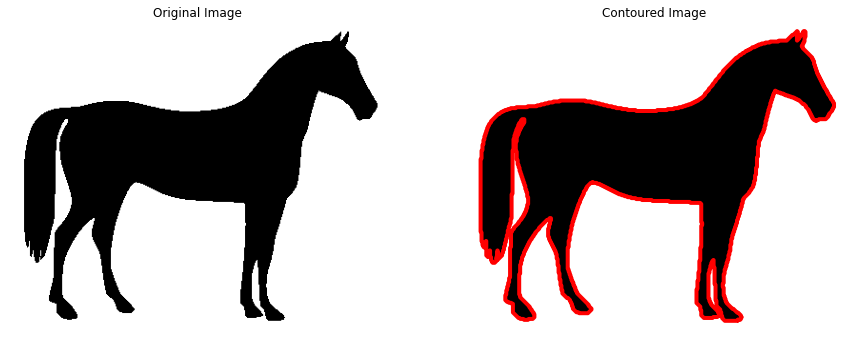

In [125]:
# Import the modules
from skimage import data, measure

# Obtain the horse image
horse_image = data.horse()

# Find the contours with a constant level value of 0.8
contours = measure.find_contours(horse_image, 0.8)


fig, ax= plt.subplots(1,2, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(horse_image, cmap= 'gray')
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(horse_image, cmap= 'gray')

for n, contour in enumerate(contours):
    plt.plot(contours[n][:, 1], contours[n][:, 0], linewidth=4, color= 'r')       # linewidth --> عرض الخط
    
plt.title('Contoured Image')
plt.axis('off')

plt.show()

____
# `Chapter 4` -- Advanced Operations, Detecting Faces and Features
____

## `1`. Finding the edges with Canny

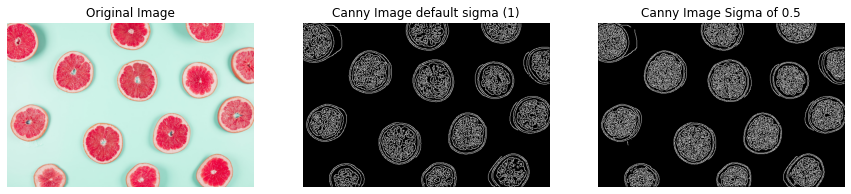

In [140]:
from skimage.feature import canny
from skimage.color import rgb2gray

toronjas_image= plt.imread('Image Processing Images//chapter 4//toronjas.jpg')

# Must convert image to grayscale before using canny filter:
toronjas_image_gray = rgb2gray(toronjas_image)

# Apply Canny detector
canny_edges = canny(toronjas_image_gray)                     # defualt [sigma] =  1
canny_edges_0_5 = canny(toronjas_image_gray, sigma=0.5)      # sigma --> بتزودلي الحبر في التحديد اكتر كل ما بقللها

fig, ax= plt.subplots(1, 3, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(toronjas_image)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(canny_edges, cmap= 'gray')
plt.title('Canny Image default sigma (1)')
plt.axis('off')

plt.sca(ax[2])
plt.imshow(canny_edges_0_5, cmap= 'gray')
plt.title('Canny Image Sigma of 0.5')
plt.axis('off')

plt.show()

## `2`. corner detection
- #### Harris corner detector

A total of 3602 corners were detected.


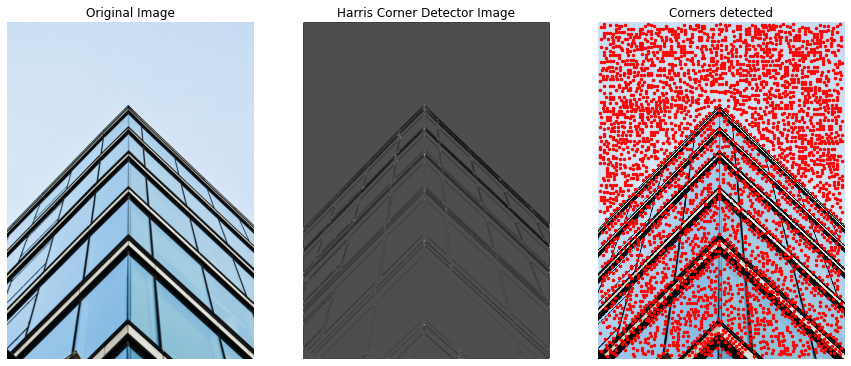

In [156]:
from skimage.feature import corner_harris, corner_peaks
from skimage import color

corners_building= plt.imread('Image Processing Images//chapter 4//corners_building_top.jpg')

# Must convert image to grayscale before using Harris corner detector:
gray_image = color.rgb2gray(corners_building)

# Apply the Harris corner detector on the image
measure_image = corner_harris(gray_image)            # [corners] دي بترسملي ال

# Finds the coordinates of the corners
coords = corner_peaks(measure_image, min_distance= 5)          # [corners] من الصوره اللي بترسملي ال [corners] دي  بتحددلي احداثيات ال
print("A total of", len(coords), "corners were detected.")


fig, ax= plt.subplots(1, 3, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(corners_building)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(measure_image, cmap= 'gray')
plt.title('Harris Corner Detector Image')
plt.axis('off')

plt.sca(ax[2])
plt.imshow(corners_building, interpolation='nearest')
plt.title('Corners detected')
plt.plot(coords[:, 1], coords[:, 0], '.r', markersize=5)
plt.axis('off')

plt.show()            # دي طالعه في الصوره في حاجه غير منطقيه مش مفهومه corners في مشكله هنا في اني ازاي ال

## `3`. Face detection

### Face detection use cases
- #### Filters
- #### Auto focus
- #### Recommendations
- #### Blur for privacy protection
- #### To recognize emotions later on

[{'r': 202, 'c': 31, 'width': 36, 'height': 36}, {'r': 202, 'c': 402, 'width': 45, 'height': 45}, {'r': 207, 'c': 152, 'width': 47, 'height': 47}, {'r': 217, 'c': 311, 'width': 39, 'height': 39}, {'r': 219, 'c': 533, 'width': 48, 'height': 48}, {'r': 218, 'c': 440, 'width': 52, 'height': 52}, {'r': 242, 'c': 237, 'width': 41, 'height': 41}]


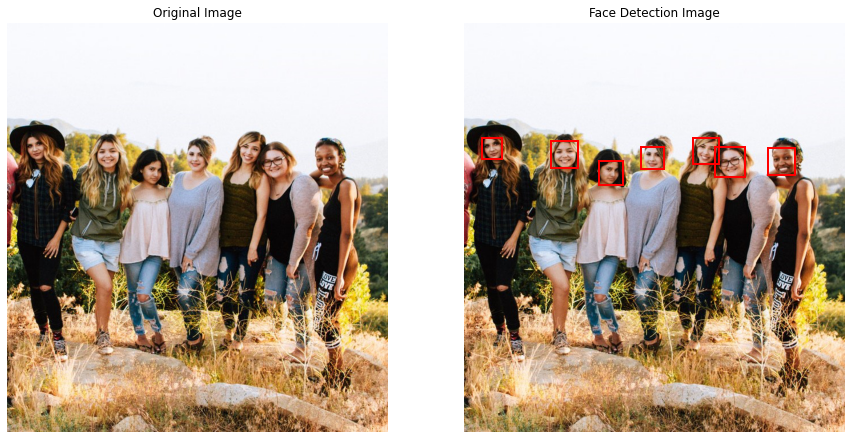

In [207]:
from skimage.feature import Cascade
from matplotlib import patches

# Load the trained file from the module root.      # [Faces] ال [detection] لازم احمله لانه هو اللي بي [Cascade] ده ملف ال
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade.
detector = Cascade(trained_file)

# Apply detector on the image
image= plt.imread('Image Processing Images//chapter 4//face_det_friends22.jpg')
detected = detector.detect_multi_scale(img= image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))
print(detected)



fig, ax= plt.subplots(1, 2, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
for patch in detected:
    img_desc= plt.gca()
    img_desc.add_patch( patches.Rectangle( (patch['c'], patch['r']),
                                           patch['width'],
                                           patch['height'],
                                           fill=False,
                                           color='r',
                                           linewidth=2) )
plt.imshow(image)

plt.title('Face Detection Image')
plt.axis('off')

plt.show()

[{'r': 774, 'c': 131, 'width': 40, 'height': 40}]


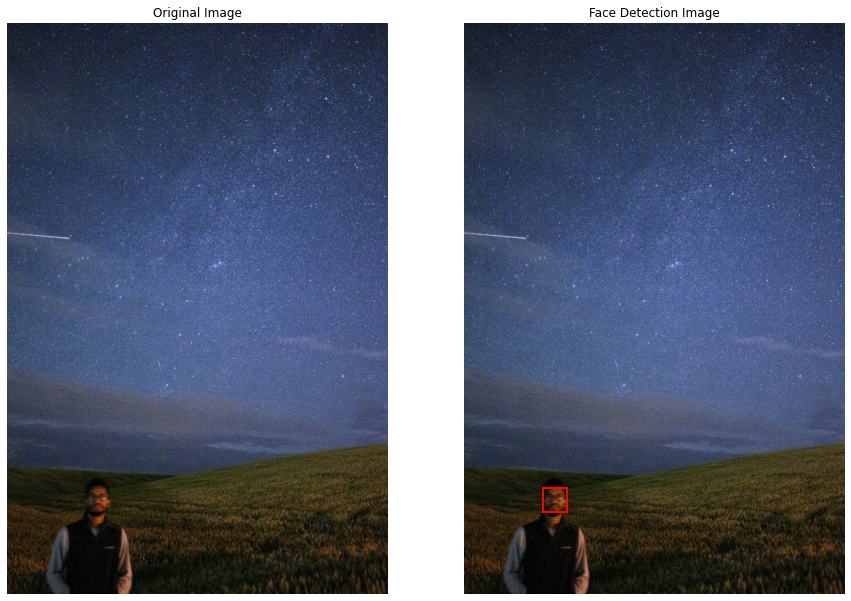

In [208]:
# Apply detector on the image
image= plt.imread('Image Processing Images//chapter 4//face_det3.jpg')
detected = detector.detect_multi_scale(img= image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))
print(detected)



fig, ax= plt.subplots(1, 2, figsize= [15, 15])

plt.sca(ax[0])
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
for patch in detected:
    img_desc= plt.gca()
    img_desc.add_patch( patches.Rectangle( (patch['c'], patch['r']),
                                           patch['width'],
                                           patch['height'],
                                           fill=False,
                                           color='r',
                                           linewidth=2) )
plt.imshow(image)

plt.title('Face Detection Image')
plt.axis('off')

plt.show()

<ipython-input-221-4ea8d8278967>:8: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  segments = slic(image, 300)
<ipython-input-221-4ea8d8278967>:9: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  segmented_image = label2rgb(segments, image, kind='avg')


[{'r': 171, 'c': 192, 'width': 154, 'height': 154}]


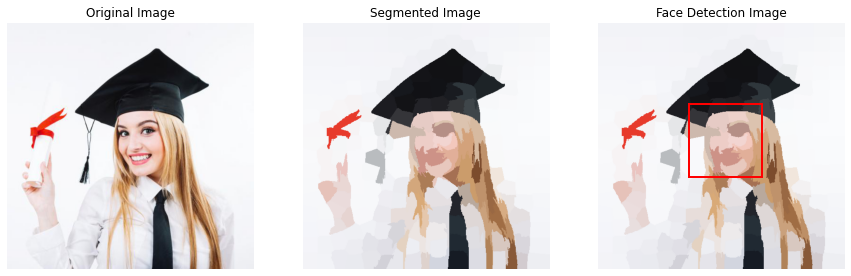

In [221]:
# Apply detector on the image
from skimage.segmentation import slic
from skimage.color import label2rgb

image= plt.imread('Image Processing Images//chapter 4//sally2.jpg')

# Obtain the segmentation with default 100 regions
segments = slic(image, 300)
segmented_image = label2rgb(segments, image, kind='avg')

detected = detector.detect_multi_scale(img= segmented_image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))
print(detected)



fig, ax= plt.subplots(1, 3, figsize= [15, 15])

plt.sca(ax[0])
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
plt.imshow(segmented_image.astype('uint8'))
plt.title('Segmented Image')
plt.axis('off')

plt.sca(ax[2])
for patch in detected:
    img_desc= plt.gca()
    img_desc.add_patch( patches.Rectangle( (patch['c'], patch['r']),
                                           patch['width'],
                                           patch['height'],
                                           fill=False,
                                           color='r',
                                           linewidth=2) )
plt.imshow(segmented_image.astype('uint8'))

plt.title('Face Detection Image')
plt.axis('off')

plt.show()

___
# `Real-world applications`

### 1. `Distorting faces` so that they are not recognised ------ `تشوه الوجوه` لعدم التعرف عليها

In [422]:
# قبل مانشتغل علي الوجوه ونعمل علي تشوييها انا في البدايه عايز اوضح بعض المفاهيم
# {} يعني ناتج هو في كام وجه في الصوره ولما بطبعها بترجعلي احداثيات كل وجه وكل وجه في [Face detection] بتبقي ناتج [detected] ال
# [width] وهيبقي ده عرض الوجه بالنسبالي يعني هيبقي ال [width] مع ال [r] فأنا هعمل لوب علي كل وجه وهجمع احداثي العرض اللي هو 
# [height] وهيبقي ده طول الوجه بالنسبالي يعني هيبقي ال [height] مع ال [c] وهجمع احداثي الطول اللي هو 
# لكل وجه فكدا يبقي انا عندي الوجه بالفعل [height] وال [width] فكوني عندي ال
# من مصفوفه الصوره كلها عشان اطلع مصفوفه الوجه والكلام ده طبعاً مع كل وجه في الصوره slice وبكده هقدر اعمل 
# [Segmentation & Superpixel] مصفوفه الوجه دي بقي هعمل فيها اللي انا عايزه فأنا هنا عايز أشوه الوجوه فبالتالي هعمل عليها ألجورزم ال
# وبعد ما هعمل الالجورزم علي كل الوجوه هكون عايز ارجع الوجوه تاني في الصوره الاصليه بعد التشويه عشان اطبع الصوره كامله في الاخر ولكن مشوهه الوجوه  

img = np.array(Image.open('Image Processing Images//chapter 4//face_det_friends22.jpg'))

trained_file = data.lbp_frontal_face_cascade_filename()
detector = Cascade(trained_file) 
detected = detector.detect_multi_scale(img= img,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))
print(len(detected),'\n')
detected


7 



[{'r': 202, 'c': 31, 'width': 36, 'height': 36},
 {'r': 202, 'c': 402, 'width': 45, 'height': 45},
 {'r': 207, 'c': 152, 'width': 47, 'height': 47},
 {'r': 217, 'c': 311, 'width': 39, 'height': 39},
 {'r': 219, 'c': 533, 'width': 48, 'height': 48},
 {'r': 218, 'c': 440, 'width': 52, 'height': 52},
 {'r': 242, 'c': 237, 'width': 41, 'height': 41}]

<ipython-input-421-460844bc1354>:21: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  segmented_image = label2rgb( slic(face, n_segments= 25) , face, kind='avg')
<ipython-input-421-460844bc1354>:21: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  segmented_image = label2rgb( slic(face, n_segments= 25) , face, kind='avg')


(-0.5, 666.5, 716.5, -0.5)

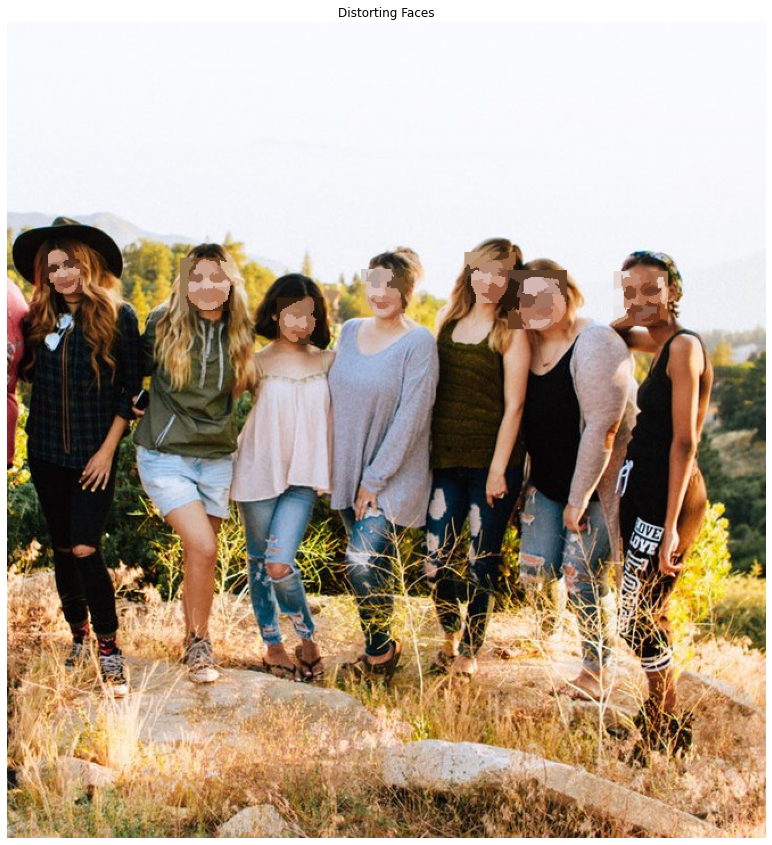

In [421]:
from PIL import Image
from skimage.feature import Cascade
from skimage.segmentation import slic
from skimage.color import label2rgb


img = np.array(Image.open('Image Processing Images//chapter 4//face_det_friends22.jpg'))

trained_file = data.lbp_frontal_face_cascade_filename()
detector = Cascade(trained_file) 
detected = detector.detect_multi_scale(img= img,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))

for d in detected:
    x, y = d['r'], d['c']      # X and Y starting points of the face rectangle
    width, height = d['r'] + d['width'], d['c'] + d['height']         # The width and height of the face rectangle
    face= img[x:width, y:height]          # Extract the detected face from original image
    segmented_image = label2rgb( slic(face, n_segments= 25) , face, kind='avg')     # Segment face then Distort it 
    img[x:width, y:height] = segmented_image     # Merge this [Distorted face] to our final image


fig, ax= plt.subplots(figsize= [15, 15])
plt.imshow(img)
plt.title('Distorting Faces')
plt.axis('off')

____
### 2. `Hide Faces` so that they are not recognised ------ `تشوه الوجوه` لعدم التعرف عليها تماماً 

[{'r': 202, 'c': 31, 'width': 36, 'height': 36}, {'r': 202, 'c': 402, 'width': 45, 'height': 45}, {'r': 207, 'c': 152, 'width': 47, 'height': 47}, {'r': 217, 'c': 311, 'width': 39, 'height': 39}, {'r': 219, 'c': 533, 'width': 48, 'height': 48}, {'r': 218, 'c': 440, 'width': 52, 'height': 52}, {'r': 242, 'c': 237, 'width': 41, 'height': 41}]


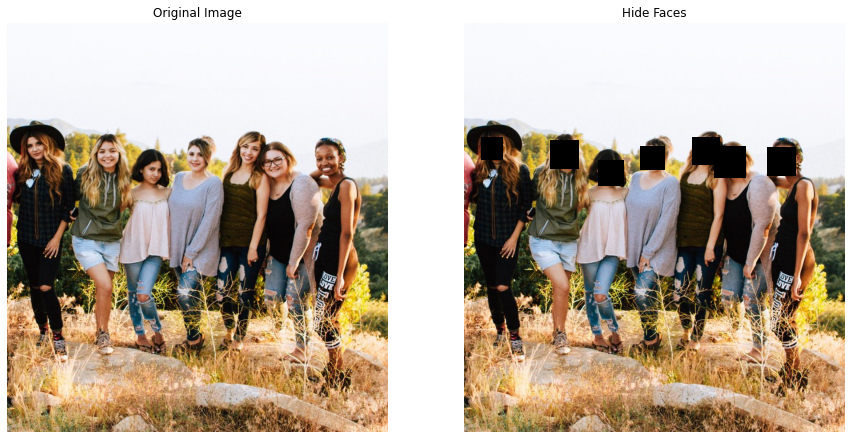

In [428]:
from skimage.feature import Cascade
from matplotlib import patches

# Load the trained file from the module root.      # [Faces] ال [detection] لازم احمله لانه هو اللي بي [Cascade] ده ملف ال
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade.
detector = Cascade(trained_file)

# Apply detector on the image
image= plt.imread('Image Processing Images//chapter 4//face_det_friends22.jpg')
detected = detector.detect_multi_scale(img= image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))
print(detected)



fig, ax= plt.subplots(1, 2, figsize= [15, 10])

plt.sca(ax[0])
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.sca(ax[1])
for face in detected:
    img_desc= plt.gca()
    img_desc.add_patch( patches.Rectangle( (face['c'], face['r']),
                                           face['width'],
                                           face['height'],
                                           fill= True,
                                           color='k',
                                           linewidth=2) )
plt.imshow(image)

plt.title('Hide Faces')
plt.axis('off')

plt.show()